# Portfolio Assignment 3 - Preprocessing and Sentiment Analysis

In [41]:
# import packages
import json
import string
import nltk
from nltk.tokenize import word_tokenize
import re
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import numpy as np
import pandas as pd
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import urllib.request
import csv 
from scipy.special import softmax

# Loading in data

In [34]:
# loading the data in for liberals
with open('reddit_data_new/democrat_comments.json') as f:
    data_lib = json.load(f)

# loading the data in for conservative
with open('reddit_data_new/republican_comments.json') as f:
    data_con = json.load(f)

# Preparing the twitter-roberta-base model for sentiment analysis

In [120]:
# load the model in and specify its task as sentiment
task='sentiment'
MODEL = f"cardiffnlp/twitter-roberta-base-{task}"

# load huggingface's tokenizer
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

# Preprocess text (username and links)
def preprocess(text):
    new_text = []
 
    for t in text.split(" "):
        t = '@user' if t.startswith('@') and len(t) > 1 else t
        t = 'http' if t.startswith('http') else t
        new_text.append(t)
    return " ".join(new_text)

# map the numeric labels onto negative, neutral and positive from a document
labels=[]
mapping_link = f"https://raw.githubusercontent.com/cardiffnlp/tweeteval/main/datasets/{task}/mapping.txt"
with urllib.request.urlopen(mapping_link) as f:
    html = f.read().decode('utf-8').split("\n")
    csvreader = csv.reader(html, delimiter='\t')
labels = [row[1] for row in csvreader if len(row) > 1]

# look at labels
print("Labels:", labels)

Labels: ['negative', 'neutral', 'positive']


# Extract comments from the json-file, which contains comments from r/conservative

In [121]:
# Get comments from the "comment" column, including submission_id
def extract_comments(data_con):
    comments_with_timestamps = []
    for entry in data_con:  # Loop through each object in the JSON
        if "comment" in entry and "created" in entry and "submission_id" in entry:  # Check if all keys exist
            comments_with_timestamps.append({
                "comment": entry["comment"], 
                "created": entry["created"],  # Extract the created timestamp
                "submission_id": entry["submission_id"]  # Extract the submission ID
            })
    return comments_with_timestamps

# Use the function
text = extract_comments(data_con)

# Let's see what it looks like
for comment in text:
    print(comment)


{'comment': "/r/Republican is a partisan subreddit.  This is a place for Republicans to discuss issues with other Republicans.\nTo those visiting this thread, we ask that unless you identify as Republican that you refrain from commenting and [leave the vote button alone](https://www.reddit.com/r/MetaRepublican/comments/5t017a/this_sub_is_for_republicans_if_you_do_not/). Non republicans who come to our sub looking for a 'different perspective' [subvert that very perspective with their own views when they vote or comment.](http://i.imgur.com/XqL0wfR.jpg)\n\n*I am a bot, and this action was performed automatically. Please [contact the moderators of this subreddit](/message/compose/?to=/r/Republican) if you have any questions or concerns.*", 'created': '2024-11-18 23:13:31', 'submission_id': '1guh6id'}
{'comment': "We are witnessing the culture changing in a very positive direction and I love it.\n\nI'm not tired of winning yet.", 'created': '2024-11-18 23:23:38', 'submission_id': '1guh6id

# Sentiment Analysis for conservatives

In [46]:
# Empty list to store the results
results = []

# Loop through each comment
for entry in text:  # Assuming text contains dictionaries with "comment", "created", and "submission_id"
    comment = entry.get("comment")  # Extract the comment
    created = entry.get("created")  # Extract the created timestamp
    submission_id = entry.get("submission_id")  # Extract the submission ID

    if comment and isinstance(comment, str) and comment.strip():
        preprocessed_comment = preprocess(comment)

        # Tokenize and prepare input
        encoded_input = tokenizer(preprocessed_comment, return_tensors='pt', truncation=True, max_length=512)
        output = model(**encoded_input)

        # Get the logits and apply softmax
        scores = output[0][0].detach().numpy()
        scores = softmax(scores)

        # Find the top sentiment
        ranking = np.argsort(scores)[::-1]
        top_sentiment = labels[ranking[0]]
        top_score = np.round(float(scores[ranking[0]]), 4)

        # Save the result
        results.append({
            "Comment": comment,
            "Created": created,  # Add the original timestamp from the JSON
            "Submission ID": submission_id,  # Add the submission ID
            "Sentiment": top_sentiment,
            "Score": top_score,
            "Negative Probability": np.round(float(scores[0]), 4),
            "Neutral Probability": np.round(float(scores[1]), 4),
            "Positive Probability": np.round(float(scores[2]), 4),
        })

# Add Subreddit column
for item in results:
    item["Subreddit"] = "r/Republican"

# Convert to DataFrame
df = pd.DataFrame(results)

# Check the DataFrame
print(df)

# Save to CSV
df.to_csv("republican_sentiment_checck.csv", index=False)
print("Results saved to 'republican_sentiment.csv'")


                                                 Comment              Created  \
0      /r/Republican is a partisan subreddit.  This i...  2024-11-18 23:13:31   
1      We are witnessing the culture changing in a ve...  2024-11-18 23:23:38   
2      Too bad he is kind of a terrible person at times.  2024-11-18 23:44:19   
3      There was another post of his followings, and ...  2024-11-18 23:33:44   
4      Don't be petty like the left dude. This was a ...  2024-11-18 23:37:03   
...                                                  ...                  ...   
11269  Thanks . I hope you undertand that my original...  2024-11-06 05:28:36   
11270  To go a little further, as a woman, the aborti...  2024-11-06 12:28:01   
11271  Same here. I've never needed to worry about ab...  2024-11-06 13:49:56   
11272  /r/Republican is a partisan subreddit.  This i...  2024-11-06 00:10:53   
11273  I think we'll have to be very careful before w...  2024-11-06 00:18:46   

      Submission ID Sentime

# Extract comments from the json-file, which contains comments from r/liberal

In [122]:
# use the function
text_lib = extract_comments(data_lib)

# lets see what it looks like
for comment in text_lib:
    print(comment)

{'comment': 'If it\'s the Lord\'s Prayer, there\'s this part:\n\n"Forgive us of our trespasses...."\n\nHe could follow that up with this video of Trump FLAT OUT saying he doesn\'t ask for forgiveness:\n\n[https://youtu.be/bp73zbYwaqw?si=r5PSVv8E3U3DW-mX](https://youtu.be/bp73zbYwaqw?si=r5PSVv8E3U3DW-mX)\n\nYa know, just for good measure.  Maybe it was just Jesus being super silly.\n\nI\'m sure he knows best though, ya know, like Satan.', 'created': '2024-11-18 23:58:09', 'submission_id': '1gui2mk'}
{'comment': 'N op e', 'created': '2024-11-18 23:55:36', 'submission_id': '1gui2mk'}
{'comment': 'Focusing on the guy with overt ties to Project 2025 should be a no brainer', 'created': '2024-11-18 22:29:57', 'submission_id': '1gug0x3'}
{'comment': 'Tom Homan was a P25 contributor as well.', 'created': '2024-11-18 23:48:11', 'submission_id': '1gug0x3'}
{'comment': 'I don’t think the smoke screen for the ship of fools is working. We can still see the 💩 on deck: Carr.', 'created': '2024-11-18 2

# Sentiment Analysis for liberals

In [124]:

# Loop through each comment
for entry in text_lib:  # Assuming text_lib contains dictionaries with "comment", "created", and "submission_id"
    comment = entry.get("comment")  # Extract the comment
    created = entry.get("created")  # Extract the created timestamp
    submission_id = entry.get("submission_id")  # Extract the submission ID

    if comment and isinstance(comment, str) and comment.strip():
        preprocessed_comment = preprocess(comment)

        # Tokenize and prepare input
        encoded_input = tokenizer(preprocessed_comment, return_tensors='pt', truncation=True, max_length=512)
        output = model(**encoded_input)

        # Get the logits and apply softmax
        scores = output[0][0].detach().numpy()
        scores = softmax(scores)

        # Find the top sentiment
        ranking = np.argsort(scores)[::-1]
        top_sentiment = labels[ranking[0]]
        top_score = np.round(float(scores[ranking[0]]), 4)

        # Save the result
        results.append({
            "Comment": comment,
            "Created": created,  # Add the original timestamp from the JSON
            "Submission ID": submission_id,  # Add the submission ID
            "Sentiment": top_sentiment,  # Properly assigned from labels
            "Score": top_score,
            "Negative Probability": np.round(float(scores[0]), 4),
            "Neutral Probability": np.round(float(scores[1]), 4),
            "Positive Probability": np.round(float(scores[2]), 4),
        })

# Add Subreddit column
for item in results:
    item["Subreddit"] = "r/Democrats"

# Convert to DataFrame
df = pd.DataFrame(results)

# Check the DataFrame
print(df)

# Save to CSV
df.to_csv("democrat_sentiment_checckk.csv", index=False)
print("Results saved to 'democrat_sentiment.csv'")


                                                 Comment              Created  \
0      If it's the Lord's Prayer, there's this part:\...  2024-11-18 23:58:09   
1                                                 N op e  2024-11-18 23:55:36   
2      Focusing on the guy with overt ties to Project...  2024-11-18 22:29:57   
3               Tom Homan was a P25 contributor as well.  2024-11-18 23:48:11   
4      I don’t think the smoke screen for the ship of...  2024-11-18 22:59:07   
...                                                  ...                  ...   
39601             Georgia exit poll is concerning though  2024-11-06 00:50:30   
39602  Did you see the newest exit poll that came out...  2024-11-06 01:12:19   
39603                                Ya Georgia is done.  2024-11-06 01:12:41   
39604  I’m not sure. Not a lot reporting, but she is ...  2024-11-06 01:20:19   
39605  **Take action:**\n\n**[Make a plan to vote](ht...  2024-11-06 00:00:57   

      Submission ID Sentime

# load the data in again

In [177]:
dfc = pd.read_csv('republican_sentiment_checck.csv')
dfl = pd.read_csv('democrat_sentiment_checckk.csv')

# Removing bot comments

In [178]:
# Remove rows where the 'Comment' contains "I am a bot"
dfc = dfc[~dfc['Comment'].str.contains("I am a bot", na=False)]
dfl = dfl[~dfl['Comment'].str.contains("I am a bot", na=False)]

# Proportion of negative and positive comments before aggregating

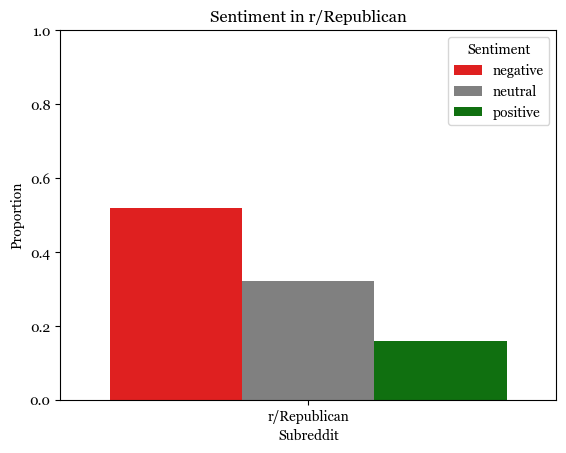

In [179]:
colours = ['red', 'gray', 'green']

# Calculate sentiment proportions
sentiment_counts = dfc.groupby(["Subreddit", "Sentiment"]).size().reset_index(name="Count")
total_counts = sentiment_counts.groupby("Subreddit")["Count"].transform("sum")
sentiment_counts["Proportion"] = sentiment_counts["Count"] / total_counts

# Plot proportions
sns.barplot(data=sentiment_counts, x="Subreddit", y="Proportion", hue="Sentiment", palette=colours)
plt.title("Sentiment in r/Republican")
plt.xlabel("Subreddit")
plt.ylabel("Proportion")
plt.ylim(0, 1)  # Set the y-axis range from 0 to 1
plt.legend(title="Sentiment")
plt.show()

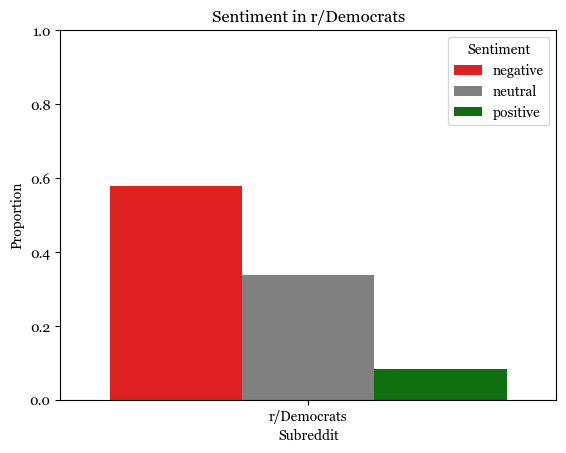

In [182]:
# Calculate sentiment proportions
sentiment_counts = dfl.groupby(["Subreddit", "Sentiment"]).size().reset_index(name="Count")
total_counts = sentiment_counts.groupby("Subreddit")["Count"].transform("sum")
sentiment_counts["Proportion"] = sentiment_counts["Count"] / total_counts

# Plot proportions
sns.barplot(data=sentiment_counts, x="Subreddit", y="Proportion", hue="Sentiment", palette=colours)
plt.title("Sentiment in r/Democrats")
plt.xlabel("Subreddit")
plt.ylabel("Proportion")
plt.ylim(0, 1)  # Set the y-axis range from 0 to 1
plt.legend(title="Sentiment")
plt.show()


# Conservative line chart

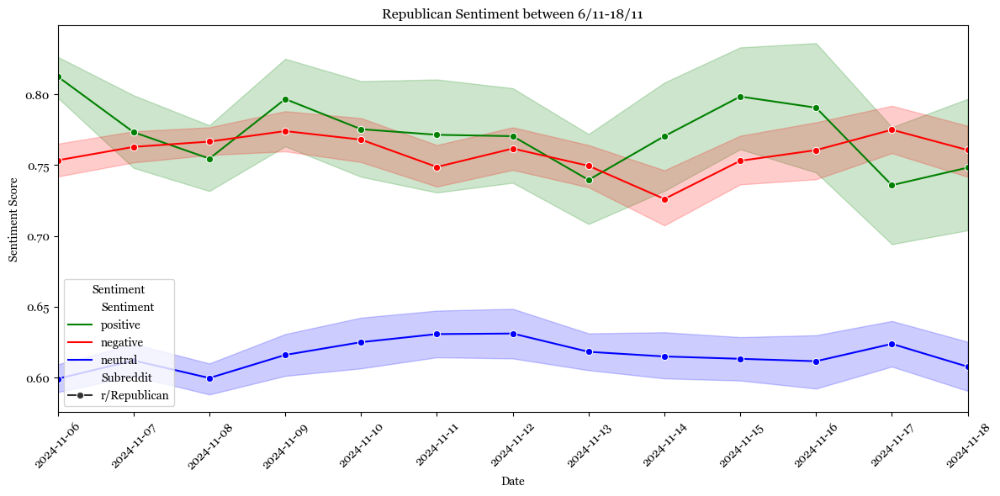

In [181]:
colors = ['green', 'red', 'blue']


#  datetime format
dfc["Created"] = pd.to_datetime(dfc["Created"])  # Use 'Created' from JSON
dfc["Date"] = dfc["Created"].dt.date  # Extract date for grouping

# filter data for the specific date range
start_date = pd.to_datetime("2024-11-06").date()
end_date = pd.to_datetime("2024-11-18").date()
filtered_dfl = dfc[(dfc["Date"] >= start_date) & (dfc["Date"] <= end_date)]

#  x-axis ticks
date_range = pd.date_range(start=start_date, end=end_date, freq="D")

# Plot it
plt.figure(figsize=(12, 6))
sns.lineplot(data=filtered_dfl, x="Date", y="Score", hue="Sentiment", style="Subreddit", markers=True, palette = colors)
plt.title("Republican Sentiment between 6/11-18/11")
plt.xlabel("Date")
plt.ylabel("Sentiment Score")

# Set x-axis ticks
plt.xticks(date_range, rotation=45)

# Set the x-axis limits explicitly
plt.xlim(start_date, end_date)

plt.tight_layout()
plt.legend(title="Sentiment")
plt.show()


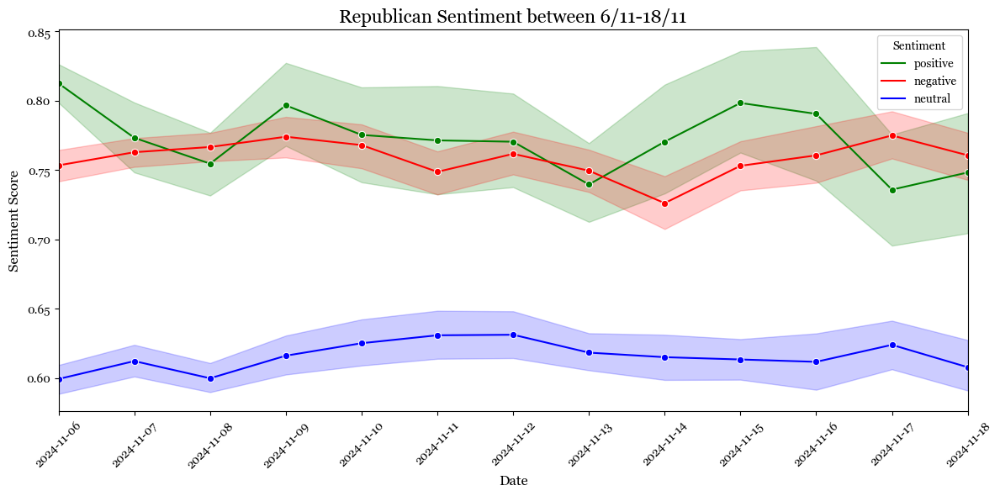

In [183]:
from matplotlib import rcParams

# change font
rcParams['font.family'] = 'Georgia'

# Define colors for sentiment categories
colors = {"positive": "green", "negative": "red", "neutral": "blue"}

# datetime
dfc["Created"] = pd.to_datetime(dfc["Created"])  # Use 'Created' from JSON
dfc["Date"] = dfc["Created"].dt.date  # Extract date for grouping

# Filter 
start_date = pd.to_datetime("2024-11-06").date()
end_date = pd.to_datetime("2024-11-18").date()
filtered_dfl = dfc[(dfc["Date"] >= start_date) & (dfc["Date"] <= end_date)]

# x-axis ticks
date_range = pd.date_range(start=start_date, end=end_date, freq="D")

# Plot sentiment scores
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=filtered_dfl,
    x="Date",
    y="Score",
    hue="Sentiment",
    style="Subreddit",
    markers=True,
    palette=colors  # Use the specified color palette
)

# change titles
plt.title("Republican Sentiment between 6/11-18/11", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Sentiment Score", fontsize=12)

# Set x-axis ticks to every date in the range
plt.xticks(date_range, rotation=45)

# Set the x-axis limits explicitly
plt.xlim(start_date, end_date)

# Remove unnecessary stuff
handles, labels = plt.gca().get_legend_handles_labels()
filtered_legend = [(h, l) for h, l in zip(handles, labels) if l in colors.keys()]
plt.legend(*zip(*filtered_legend), title="Sentiment")

# Adjust layout 
plt.tight_layout()

# Show the plot
plt.show()

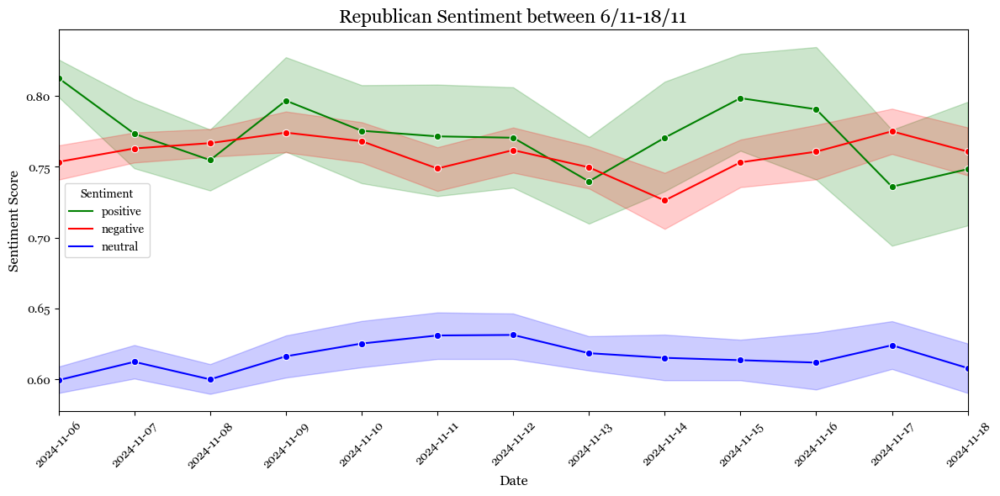

In [184]:
from matplotlib import rcParams

# change font
rcParams['font.family'] = 'Georgia'

# Define colors
colors = {"positive": "green", "negative": "red", "neutral": "blue"}

# datetime
dfc["Created"] = pd.to_datetime(dfc["Created"])  # Use 'Created' from JSON
dfc["Date"] = dfc["Created"].dt.date  # Extract date for grouping

# Filter 
start_date = pd.to_datetime("2024-11-06").date()
end_date = pd.to_datetime("2024-11-18").date()
filtered_dfl = dfc[(dfc["Date"] >= start_date) & (dfc["Date"] <= end_date)]

# x-axis ticks
date_range = pd.date_range(start=start_date, end=end_date, freq="D")

# Plot the daily sentiment scores
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=filtered_dfl,
    x="Date",
    y="Score",
    hue="Sentiment",
    style="Subreddit",
    markers=True,
    palette=colors  # Use the specified color palette
)

# change titles
plt.title("Republican Sentiment between 6/11-18/11", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Sentiment Score", fontsize=12)

# Set x-axis ticks to every date in the range
plt.xticks(date_range, rotation=45)

# Set the x-axis limits explicitly
plt.xlim(start_date, end_date)

# Remove unnecessary legend stuff
handles, labels = plt.gca().get_legend_handles_labels()
filtered_legend = [(h, l) for h, l in zip(handles, labels) if l in colors.keys()]
plt.legend(*zip(*filtered_legend), title="Sentiment")

# Adjust layout 
plt.tight_layout()

# Show the plot
plt.show()

# Liberal line chart

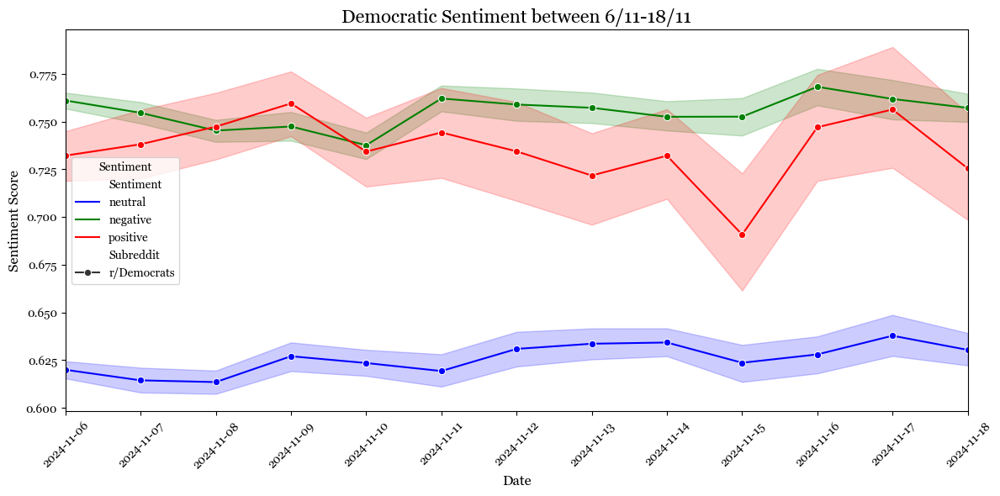

In [185]:
# Set font family
rcParams['font.family'] = 'Georgia'

# Define colors 
colors = ['blue', 'green', 'red'] 

# datetime
dfl["Created"] = pd.to_datetime(dfl["Created"])  # Use 'Created' from JSON
dfl["Date"] = dfl["Created"].dt.date  # Extract date for grouping


# Filter data for the specific date range
start_date = pd.to_datetime("2024-11-06").date()
end_date = pd.to_datetime("2024-11-18").date()
filtered_dfl = dfl[(dfl["Date"] >= start_date) & (dfl["Date"] <= end_date)]

# Generate x-axis ticks for the specific date range
date_range = pd.date_range(start=start_date, end=end_date, freq="D")

# Plot the filtered data
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=filtered_dfl,
    x="Date",
    y="Score",
    hue="Sentiment",
    style="Subreddit",
    markers=True,
    palette=colors
)

# Set plot title and labels
plt.title("Democratic Sentiment between 6/11-18/11", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Sentiment Score", fontsize=12)

# Set x-axis ticks to every date in the range and rotate them for better visibility
plt.xticks(date_range, rotation=45)

# Set explicit x-axis limits to ensure the plot covers the desired date range
plt.xlim(start_date, end_date)

# Adjust layout to prevent clipping
plt.tight_layout()

# Set a proper legend title
plt.legend(title="Sentiment")

# Display the plot
plt.show()


# lets aggregate the data 

In [163]:
# Assuming df is your DataFrame
# Aggregating data by 'Submission_ID'
def most_common_sentiment(series):
    # Get the most common sentiment if there are multiple, otherwise keep the existing one
    if len(series) > 1:
        return series.value_counts().idxmax()
    else:
        return series.iloc[0]

# Perform the aggregation
dfc = dfc.groupby('Submission ID').agg(
    Score=('Score', 'mean'),  # Average score for each Submission_ID
    Subreddit=('Subreddit', 'first'),  # Take the first Subreddit (assuming they are all the same)
    Sentiment=('Sentiment', most_common_sentiment),  # Take the first encoded value (assuming it's the same for all)
    Created=('Created', 'first')  # Take the first created timestamp (assuming they are all the same)
).reset_index()

# View the aggregated data
print(dfc)

    Submission ID     Score     Subreddit Sentiment             Created
0         1gkk78c  0.533700  r/Republican  negative 2024-11-06 00:18:46
1         1gkk9yw  0.759363  r/Republican  negative 2024-11-06 01:55:07
2         1gkl9xu  0.866817  r/Republican  positive 2024-11-06 01:44:44
3         1gklef9  0.753780  r/Republican  positive 2024-11-06 03:27:24
4         1gklgr0  0.744394  r/Republican   neutral 2024-11-06 02:31:37
..            ...       ...           ...       ...                 ...
290       1gu944z  0.807225  r/Republican  negative 2024-11-18 17:52:40
291       1gua2me  0.627850  r/Republican   neutral 2024-11-18 20:05:53
292       1gud065  0.697184  r/Republican  negative 2024-11-18 22:05:44
293       1gufjhm  0.773558  r/Republican  negative 2024-11-18 22:15:53
294       1guh6id  0.849683  r/Republican  positive 2024-11-18 23:23:38

[295 rows x 5 columns]


In [164]:
# Perform the aggregation
dfl = dfl.groupby('Submission ID').agg(
    Score=('Score', 'mean'),  # Average score for each Submission_ID
    Subreddit=('Subreddit', 'first'),  # Take the first Subreddit (assuming they are all the same)
    Sentiment=('Sentiment', most_common_sentiment),  # Take the first encoded value (assuming it's the same for all)
    Created=('Created', 'first')  # Take the first created timestamp (assuming they are all the same)
).reset_index()
# View the aggregated data
print(dfl)

    Submission ID     Score    Subreddit Sentiment             Created
0         1gkk4w7  0.670771  r/Democrats   neutral 2024-11-06 00:25:12
1         1gkkavy  0.657075  r/Democrats   neutral 2024-11-06 00:59:02
2         1gkkh2z  0.721333  r/Democrats   neutral 2024-11-06 00:26:42
3         1gkknun  0.740660  r/Democrats  negative 2024-11-06 01:08:03
4         1gkkowd  0.744959  r/Democrats  negative 2024-11-06 01:22:52
..            ...       ...          ...       ...                 ...
548       1gueejr  0.670400  r/Democrats   neutral 2024-11-18 22:16:23
549       1gufxaa  0.800800  r/Democrats  negative 2024-11-18 23:42:29
550       1gufxyb  0.710650  r/Democrats   neutral 2024-11-18 23:12:00
551       1gug0x3  0.787180  r/Democrats  negative 2024-11-18 22:29:57
552       1gui2mk  0.551650  r/Democrats   neutral 2024-11-18 23:58:09

[553 rows x 5 columns]


# Proportion of negative, netural and positive comments for republicans


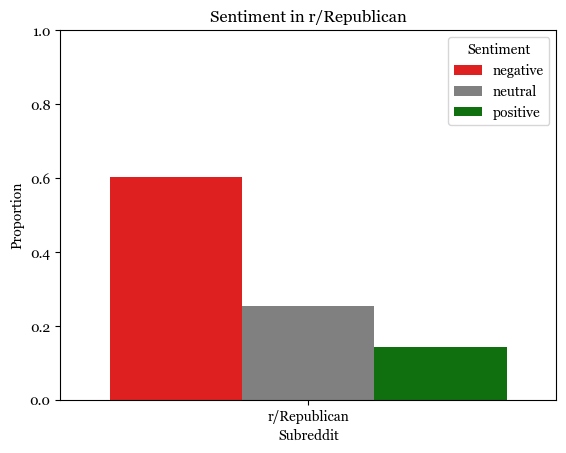

In [165]:
colours = ['red', 'gray', 'green']

# Calculate sentiment proportions
sentiment_counts = dfc.groupby(["Subreddit", "Sentiment"]).size().reset_index(name="Count")
total_counts = sentiment_counts.groupby("Subreddit")["Count"].transform("sum")
sentiment_counts["Proportion"] = sentiment_counts["Count"] / total_counts

# Plot proportions
sns.barplot(data=sentiment_counts, x="Subreddit", y="Proportion", hue="Sentiment", palette=colours)
plt.title("Sentiment in r/Republican")
plt.xlabel("Subreddit")
plt.ylabel("Proportion")
plt.ylim(0, 1)  # Set the y-axis range from 0 to 1
plt.legend(title="Sentiment")
plt.show()

# Proportion of negative, netural and positive comments for democrats

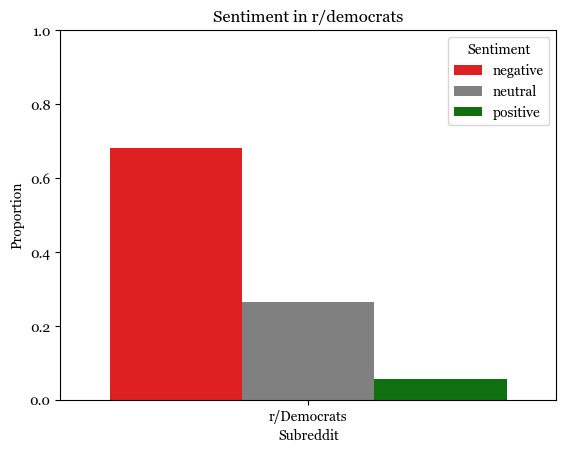

In [166]:
# Calculate sentiment proportions
sentiment_counts = dfl.groupby(["Subreddit", "Sentiment"]).size().reset_index(name="Count")
total_counts = sentiment_counts.groupby("Subreddit")["Count"].transform("sum")
sentiment_counts["Proportion"] = sentiment_counts["Count"] / total_counts

# Plot proportions
sns.barplot(data=sentiment_counts, x="Subreddit", y="Proportion", hue="Sentiment", palette=colours)
plt.title("Sentiment in r/democrats")
plt.xlabel("Subreddit")
plt.ylabel("Proportion")
plt.ylim(0, 1)  # Set the y-axis range from 0 to 1
plt.legend(title="Sentiment")
plt.show()

# Conservative mentions of gaetz

In [72]:

# Filter data for the specific date range
start_date = datetime.date(2024, 11, 13)
end_date = datetime.date(2024, 11, 15)
filtered_dfc = dfc[(dfc['Date'] >= start_date) & (dfc['Date'] <= end_date)]

# Keywords 
keywords = ["Gaetz", "Matt", "attorney general", "Matt Gaetz"]

# Count occurrences of each keyword in the 'Comment' column
keyword_counts = {
    keyword: filtered_dfc['Comment'].str.contains(keyword, case=False, na=False).sum()
    for keyword in keywords
}

# Print the counts
print("Keyword mentions in comments:")
for keyword, count in keyword_counts.items():
    print(f"{keyword}: {count}")


keyword_counts_df = pd.DataFrame(list(keyword_counts.items()), columns=['Keyword', 'Count'])

keyword_counts_df.to_csv('con_after_gaetz.csv')

TypeError: descriptor 'date' for 'datetime.datetime' objects doesn't apply to a 'int' object

# conservative mentions of Gaetz before he was chosen


In [18]:

# Filter data for the specific date range
start_date = datetime.date(2024, 11, 6)
end_date = datetime.date(2024, 11, 13)
filtered_dfc = dfc[(dfc['Date'] >= start_date) & (dfc['Date'] <= end_date)]

# Keywords 
keywords = ["Gaetz", "Matt", "attorney general", "Matt Gaetz"]

# Count occurrences of each keyword in the 'Comment' column
keyword_counts = {
    keyword: filtered_dfc['Comment'].str.contains(keyword, case=False, na=False).sum()
    for keyword in keywords
}

# Print the counts
print("Keyword mentions in comments:")
for keyword, count in keyword_counts.items():
    print(f"{keyword}: {count}")


keyword_counts_df = pd.DataFrame(list(keyword_counts.items()), columns=['Keyword', 'Count'])

keyword_counts_df.to_csv('con_before_gaetz.csv')

Keyword mentions in comments:
Gaetz: 8
Matt: 89
attorney general: 2
Matt Gaetz: 0


/var/folders/g6/73f83j794c357gq8zj7bhcgr0000gn/T/ipykernel_12764/990779773.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfc['Date'] = pd.to_datetime(dfc['Date']).dt.date


# liberal mentions of gaetz

In [17]:

# Filter data for the specific date range
start_date = datetime.date(2024, 11, 13)
end_date = datetime.date(2024, 11, 15)
filtered_dfl = dfl[(dfl['Date'] >= start_date) & (dfl['Date'] <= end_date)]

# Keywords 
keywords = ["Gaetz", "Matt", "attorney general", "Matt Gaetz"]

# Count occurrences of each keyword in the 'Comment' column
keyword_counts = {
    keyword: filtered_dfl['Comment'].str.contains(keyword, case=False, na=False).sum()
    for keyword in keywords
}

# Print the counts
print("Keyword mentions in comments:")
for keyword, count in keyword_counts.items():
    print(f"{keyword}: {count}")


keyword_counts_df = pd.DataFrame(list(keyword_counts.items()), columns=['Keyword', 'Count'])

keyword_counts_df.to_csv('lib_after_gaetz.csv')

Keyword mentions in comments:
Gaetz: 135
Matt: 133
attorney general: 29
Matt Gaetz: 32


# liberal mentions before he was chosen

In [16]:

# Filter data for the specific date range
start_date = datetime.date(2024, 11, 6)
end_date = datetime.date(2024, 11, 12)
filtered_dfl = dfl[(dfl['Date'] >= start_date) & (dfl['Date'] <= end_date)]

# Keywords 
keywords = ["Gaetz", "Matt", "attorney general", "Matt Gaetz"]

# Count occurrences of each keyword in the 'Comment' column
keyword_counts = {
    keyword: filtered_dfl['Comment'].str.contains(keyword, case=False, na=False).sum()
    for keyword in keywords
}

# Print the counts
print("Keyword mentions in comments:")
for keyword, count in keyword_counts.items():
    print(f"{keyword}: {count}")

keyword_counts_df = pd.DataFrame(list(keyword_counts.items()), columns=['Keyword', 'Count'])

keyword_counts_df.to_csv('lib_before_gaetz.csv')

Keyword mentions in comments:
Gaetz: 4
Matt: 622
attorney general: 15
Matt Gaetz: 1


# conservative submission titles after he was chosen

In [206]:
# Convert to df
df = pd.DataFrame(data_con)

# Ensure 'created' is in datetime format
df['created'] = pd.to_datetime(df['created'])

# Filter data by date range
start_date = pd.to_datetime("2024-11-13")
end_date = pd.to_datetime("2024-11-15")
filtered_df = df[(df['created'] >= start_date) & (df['created'] <= end_date)]

# Search for submission titles containing specific keywords
keywords = ["Matt", "Gaetz", "attorney general"]
keyword_mask = filtered_df['submission_title'].str.contains('|'.join(keywords), case=False, na=False)

# Get the matching submission titles
matching_titles = filtered_df[keyword_mask]

# Count the unique matching titles
unique_matching_titles_count = matching_titles['submission_title'].nunique()

# Display results
print(f"Number of unique submission titles containing {keywords} between {start_date.date()} and {end_date.date()}: {unique_matching_titles_count}")

matching_titles['submission_title'].unique()


Number of unique submission titles containing ['Matt', 'Gaetz', 'attorney general'] between 2024-11-13 and 2024-11-15: 4


array(['Matt Gaetz resigns from Congress over Trump nod to be attorney general, Johnson says',
       'Trump picks Rubio, Gaetz and Gabbard for top jobs in blitz of nominations',
       'Matt Gaetz as AG',
       "New York Attorney General Letitia James Threatens: 'This Is Not the Time to Be Fearful'"],
      dtype=object)

# Conservative titles before he was chosen

In [212]:
# Convert to df
df = pd.DataFrame(data_con)

# Ensure 'created' is in datetime format
df['created'] = pd.to_datetime(df['created'])

# Filter data by date range
start_date = pd.to_datetime("2024-11-06")
end_date = pd.to_datetime("2024-11-12")
filtered_df = df[(df['created'] >= start_date) & (df['created'] <= end_date)]

# Search for submission titles containing specific keywords
keywords = ["Matt", "Gaetz", "attorney general"]
keyword_mask = filtered_df['submission_title'].str.contains('|'.join(keywords), case=False, na=False)

# Get the matching submission titles
matching_titles = filtered_df[keyword_mask]

# Count the unique matching titles
unique_matching_titles_count = matching_titles['submission_title'].nunique()

# Display results
print(f"Number of unique submission titles containing {keywords} between {start_date.date()} and {end_date.date()}: {unique_matching_titles_count}")

matching_titles['submission_title'].unique()

Number of unique submission titles containing ['Matt', 'Gaetz', 'attorney general'] between 2024-11-06 and 2024-11-12: 1


array(["New York Attorney General Letitia James Threatens: 'This Is Not the Time to Be Fearful'"],
      dtype=object)

# liberal submission titles after he was chosen

In [203]:
# Convert to df
df = pd.DataFrame(data_lib)

# Ensure 'created' is in datetime format
df['created'] = pd.to_datetime(df['created'])

# Filter data by date range
start_date = pd.to_datetime("2024-11-13")
end_date = pd.to_datetime("2024-11-15")
filtered_df = df[(df['created'] >= start_date) & (df['created'] <= end_date)]

# Search for submission titles containing specific keywords
keywords = ["Matt", "Gaetz", "attorney general"]
keyword_mask = filtered_df['submission_title'].str.contains('|'.join(keywords), case=False, na=False)

# Get the matching submission titles
matching_titles = filtered_df[keyword_mask]

# Count the unique matching titles
unique_matching_titles_count = matching_titles['submission_title'].nunique()

# Display results
print(f"Number of unique submission titles containing {keywords} between {start_date.date()} and {end_date.date()}: {unique_matching_titles_count}")

matching_titles['submission_title'].unique()


Number of unique submission titles containing ['Matt', 'Gaetz', 'attorney general'] between 2024-11-13 and 2024-11-15: 7


array(["I'm convinced this Gaetz nomination is a 'smoke screen'. While everybody's flabbergasted with the selection, some truly nefarious shit is going on that we're not paying attention to.  ",
       'Matt Gaetz has abruptly resigned from the US House.',
       'Ladies and gents, your next Attorney General of the United States  ',
       'Republicans "stunned and disgusted" as Trump taps Matt Gaetz for AG',
       "Matt Gaetz, under House ethics investigation, is Trump's pick for attorney general",
       'Trump taps Rep. Matt Gaetz as attorney general',
       'Trump picks Matt Gaetz as attorney general …I just can’t !!!!'],
      dtype=object)

# liberal submission titles before he was chosen

In [213]:
# Convert to df
df = pd.DataFrame(data_lib)

# Filter data by date range
start_date = pd.to_datetime("2024-11-06")
end_date = pd.to_datetime("2024-11-12")
filtered_df = df[(df['created'] >= start_date) & (df['created'] <= end_date)]

# Search for submission titles containing specific keywords
keywords = ["Matt", "Gaetz", "attorney general"]
keyword_mask = filtered_df['submission_title'].str.contains('|'.join(keywords), case=False, na=False)

# Get the matching submission titles
matching_titles = filtered_df[keyword_mask]

# Count the unique matching titles
unique_matching_titles_count = matching_titles['submission_title'].nunique()

# Display results
print(f"Number of unique submission titles containing {keywords} between {start_date.date()} and {end_date.date()}: {unique_matching_titles_count}")

matching_titles['submission_title'].unique()

Number of unique submission titles containing ['Matt', 'Gaetz', 'attorney general'] between 2024-11-06 and 2024-11-12: 0


array([], dtype=object)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nadiahajighassem/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


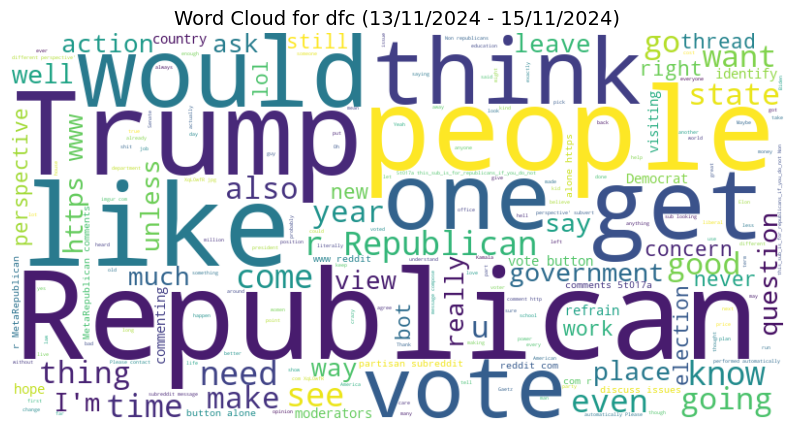

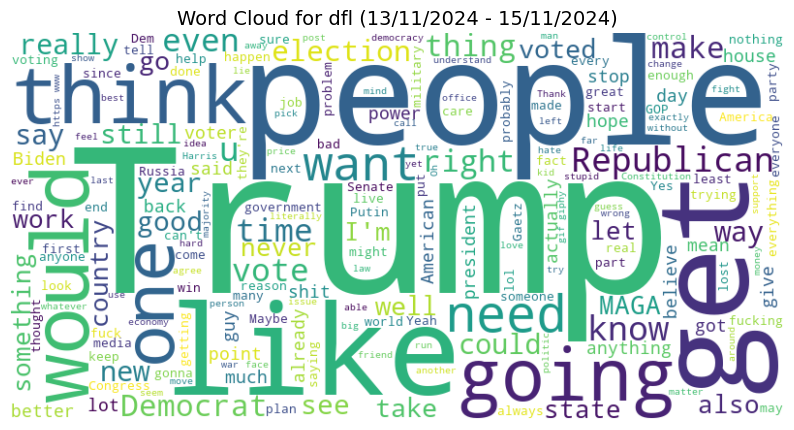

In [218]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk

# Ensure nltk resources are available
nltk.download('stopwords')

# Define the date range
start_date = pd.to_datetime("2024-11-13")
end_date = pd.to_datetime("2024-11-15")

# Ensure 'Date' is in datetime format
dfc['Date'] = pd.to_datetime(dfc['Date'])
dfl['Date'] = pd.to_datetime(dfl['Date'])

# Filter data for the specified date range
filtered_dfc = dfc[(dfc['Date'] >= start_date) & (dfc['Date'] <= end_date)]
filtered_dfl = dfl[(dfl['Date'] >= start_date) & (dfl['Date'] <= end_date)]

# Define custom stop words with nltk
nltk_stop_words = set(stopwords.words('english'))

# Function to generate a word cloud
def generate_word_cloud(dataframe, title):
    # Combine all comments into a single string
    text = " ".join(comment for comment in dataframe['Comment'] if isinstance(comment, str))

    # Generate the word cloud
    wordcloud = WordCloud(stopwords=nltk_stop_words, background_color="white", width=800, height=400).generate(text)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=14)
    plt.show()

# Generate word clouds for dfc and dfl
generate_word_cloud(filtered_dfc, "Word Cloud for dfc (13/11/2024 - 15/11/2024)")
generate_word_cloud(filtered_dfl, "Word Cloud for dfl (13/11/2024 - 15/11/2024)")

In [172]:
# get the necessary columns
data_rep = dfc[['Score', 'Subreddit', 'Sentiment', 'Submission ID']]  
data_dem = dfl[['Score', 'Subreddit', 'Sentiment', 'Submission ID']]  

# lets make them into 0 & 1
data_rep['Subreddit_encoded'] = 0  # Republican encoded as 0
data_dem['Subreddit_encoded'] = 1  # Democrat encoded as 1

,Score,Subreddit,Sentiment,Submission ID,Subreddit_encoded
0,0.670771,r/Democrats,neutral,1gkk4w7,1
1,0.657075,r/Democrats,neutral,1gkkavy,1
2,0.721333,r/Democrats,neutral,1gkkh2z,1
3,0.740660,r/Democrats,negative,1gkknun,1
4,0.744959,r/Democrats,negative,1gkkowd,1
...,...,...,...,...,...
548,0.670400,r/Democrats,neutral,1gueejr,1
549,0.800800,r/Democrats,negative,1gufxaa,1
550,0.710650,r/Democrats,neutral,1gufxyb,1
551,0.787180,r/Democrats,negative,1gug0x3,1


In [173]:
# merge them
combined_df = pd.concat([data_rep, data_dem], ignore_index=True)
combined_df

,Score,Subreddit,Sentiment,Submission ID,Subreddit_encoded
0,0.533700,r/Republican,negative,1gkk78c,0
1,0.759363,r/Republican,negative,1gkk9yw,0
2,0.866817,r/Republican,positive,1gkl9xu,0
3,0.753780,r/Republican,positive,1gklef9,0
4,0.744394,r/Republican,neutral,1gklgr0,0
...,...,...,...,...,...
843,0.670400,r/Democrats,neutral,1gueejr,1
844,0.800800,r/Democrats,negative,1gufxaa,1
845,0.710650,r/Democrats,neutral,1gufxyb,1
846,0.787180,r/Democrats,negative,1gug0x3,1


In [174]:
print(combined_df.describe()) 

            Score  Subreddit_encoded
count  848.000000         848.000000
mean     0.711363           0.652123
std      0.069914           0.476578
min      0.441300           0.000000
25%      0.679259           0.000000
50%      0.710517           1.000000
75%      0.743666           1.000000
max      0.984550           1.000000


In [176]:
# save
combined_df.to_csv("combined_df.csv", index=False)

combined_df

,Score,Subreddit,Sentiment,Submission ID,Subreddit_encoded
0,0.533700,r/Republican,negative,1gkk78c,0
1,0.759363,r/Republican,negative,1gkk9yw,0
2,0.866817,r/Republican,positive,1gkl9xu,0
3,0.753780,r/Republican,positive,1gklef9,0
4,0.744394,r/Republican,neutral,1gklgr0,0
...,...,...,...,...,...
843,0.670400,r/Democrats,neutral,1gueejr,1
844,0.800800,r/Democrats,negative,1gufxaa,1
845,0.710650,r/Democrats,neutral,1gufxyb,1
846,0.787180,r/Democrats,negative,1gug0x3,1


In [273]:
dfl_new = dfl.drop(columns=['Comment'])

dfl_new.to_csv("dfl_new.csv", index=False)

In [272]:
dfc_new = dfc.drop(columns=['Comment'])

dfc_new.to_csv("dfc_new.csv", index=False)

In [275]:
import pandas as pd

# Merge the two DataFrames by stacking rows
merged_df = pd.concat([dfc_new, dfl_new], ignore_index=True)

# Verify the merged DataFrame
print(merged_df.head())
print(merged_df.tail())

merged_df.to_csv("final.csv", index=False)

              Created Sentiment   Score  Negative Probability  \
0 2024-11-18 23:23:38  positive  0.9762                0.0029   
1 2024-11-18 23:44:19  negative  0.9765                0.9765   
2 2024-11-18 23:33:44  negative  0.9117                0.9117   
3 2024-11-18 23:37:03  positive  0.8068                0.0422   
4 2024-11-18 23:47:17  negative  0.5956                0.5956   

   Neutral Probability  Positive Probability     Subreddit        Date  
0               0.0210                0.9762  r/Republican  2024-11-18  
1               0.0209                0.0025  r/Republican  2024-11-18  
2               0.0811                0.0073  r/Republican  2024-11-18  
3               0.1510                0.8068  r/Republican  2024-11-18  
4               0.3721                0.0323  r/Republican  2024-11-18  
                  Created Sentiment   Score  Negative Probability  \
49780 2024-11-06 00:50:04   neutral  0.5361                0.3367   
49781 2024-11-06 00:50:30  negati